<a href="https://colab.research.google.com/github/ARMAGEDONgtx/CNN_Poznan_buildings_recognition/blob/master/CNN_Poznan_buildings_recognition.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## 1) Building dataset

In [0]:
# import section 
from google.colab import drive
from google.colab import patches as gc
import os
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import GridSearchCV, PredefinedSplit, train_test_split
from sklearn.utils import shuffle
from sklearn.metrics import accuracy_score, confusion_matrix
import random
from skimage.util import random_noise
import pickle
import albumentations as A
from tensorflow import keras
import tensorflow as tf
from tensorflow.keras.optimizers import SGD, Adam

Data augmentation techniques. The best option is to use albumentations library !

In [0]:
#https://www.kaggle.com/hanzh0420/image-augmentation-with-opencv

class Data_augmentation:

    def rotate(self, image):
        '''
        Rotate the image
        :param image: image to be processed
        :param angle: Rotation angle in degrees. Positive values mean counter-clockwise rotation (the coordinate origin is assumed to be the top-left corner).
        :param scale: Isotropic scale factor.
        '''
        angle=random.randint(-90, 90)
        scale=1.0
        w = image.shape[1]
        h = image.shape[0]
        #rotate matrix
        M = cv.getRotationMatrix2D((w/2,h/2), angle, scale)
        #rotate
        image = cv.warpAffine(image,M,(w,h))
        return image

    def flip(self, image):
        '''
        Flip the image
        :param image: image to be processed
        :param vflip: whether to flip the image vertically
        :param hflip: whether to flip the image horizontally
        '''
        vflip=random.randint(0,1)
        hflip=random.randint(0,1)
        if hflip or vflip:
            if hflip and vflip:
                c = -1
            else:
                c = 0 if vflip else 1
            image = cv.flip(image, flipCode=c)
        return image 
    
    def add_Noise(self, image):
      img = image.copy()
      # Add salt-and-pepper noise to the image.
      noise_img = random_noise(img, mode='s&p',amount=0.3)
      noise_img = np.array(255*noise_img, dtype = 'uint8')
      noise_img[noise_img > 255] = 255
      return noise_img
    
    def image_augment(self, image): 
        '''
        Create the new image with imge augmentation
        :param path: the path to store the new image
        ''' 
        number_of_operation = random.randint(1, 2)
        operations = [self.rotate, self.flip]
        img = image.copy()
        for x in range(number_of_operation):     
          img = operations[x](img)
        return img

    def augument_albumentation(self, image, count):
      medium = A.Compose([
            A.ShiftScaleRotate(),
            A.GaussNoise(),
            A.Cutout(),
            A.RGBShift(),
            A.ChannelShuffle(),
            A.Blur(blur_limit=5),
            A.RandomBrightness()
        ], p=1)
      images = []
      for x in range(count):
        augmented = medium(image=image)
        image = cv.cvtColor(image, cv.COLOR_BGR2RGB)
        image_aug = cv.cvtColor(augmented['image'], cv.COLOR_BGR2RGB)
        images.append(image_aug)

      return images


Get base training dataset

In [0]:
IMG_SIZE = 256

In [5]:
# mount drive 
drive.mount('/content/drive')
path_to_dataset = '/content/drive/My Drive/BoW_project/train'

X_train = []
y_train = []
y_labels = dict()
y_labels_index = dict()
data_gen = Data_augmentation()

# iterate through our dataset
for i, class_dir in enumerate(os.listdir(path_to_dataset)):
  #print("i = {}, class_dir = {}".format(i,class_dir))
  path_to_dir = os.path.join(path_to_dataset, class_dir)
  y_labels[i]=class_dir
  y_labels_index[class_dir] = i
  for filename in os.listdir(path_to_dir):
    path_to_file = os.path.join(path_to_dir,filename)
    img = cv.imread(path_to_file, 1)
    # scale but retain height - width ratio
    hw_ratio = img.shape[0]/img.shape[1]
    img_reshaped = cv.resize(img, (IMG_SIZE,IMG_SIZE))
    X_train.append(img_reshaped) 
    y_train.append(i)
    # add 10 additional image
    X_train.extend(data_gen.augument_albumentation(img_reshaped, 10))
    for x in range(10):
      y_train.append(i)


path_to_dataset = '/content/drive/My Drive/BoW_project/my_train'
# iterate through additional dataset from scappy
for i, class_dir in enumerate(os.listdir(path_to_dataset)):
  path_to_dir = os.path.join(path_to_dataset, class_dir)
  for filename in os.listdir(path_to_dir):
    path_to_file = os.path.join(path_to_dir,filename)
    img = cv.imread(path_to_file, 1)
    # scale but retain height - width ratio
    hw_ratio = img.shape[0]/img.shape[1]
    img_reshaped = cv.resize(img, (IMG_SIZE,IMG_SIZE))
    X_train.append(img_reshaped) 
    y_train.append(i)
    # add 10 additional image
    X_train.extend(data_gen.augument_albumentation(img_reshaped, 10))
    for x in range(10):
      y_train.append(y_labels_index[class_dir])


X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, stratify = y_train, test_size = 0.2)


Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


Finally create test dataset - 5 images per class

In [6]:
path_to_dataset = '/content/drive/My Drive/BoW_project/test'

X_test = []
y_test = []
y_test_lebels = dict()
# iterate through our dataset
for i, class_dir in enumerate(os.listdir(path_to_dataset)):
  #print("i = {}, class_dir = {}".format(i,class_dir))
  path_to_dir = os.path.join(path_to_dataset, class_dir)
  y_test_lebels[i] = class_dir
  for filename in os.listdir(path_to_dir):
    path_to_file = os.path.join(path_to_dir,filename)
    img = cv.imread(path_to_file, 1)
    # scale but retain height - width ratio
    hw_ratio = img.shape[0]/img.shape[1]
    img_reshaped = cv.resize(img, (IMG_SIZE,IMG_SIZE))
    X_test.append(img_reshaped)
    y_test.append(y_labels_index[class_dir])

print(y_labels)
print(y_test_lebels)

{0: 'uam', 1: 'teatr_wielki', 2: 'okraglak', 3: 'baltyk', 4: 'katedra'}
{0: 'okraglak', 1: 'baltyk', 2: 'uam', 3: 'teatr_wielki', 4: 'katedra'}


In [7]:
X_train = np.asarray(X_train)
X_valid = np.asarray(X_valid)
X_test = np.asarray(X_test)

y_train = np.asarray(y_train)
y_valid = np.asarray(y_valid)
y_test = np.asarray(y_test)

print(type(X_train))
print(np.shape(X_train))

print(type(X_valid))
print(np.shape(X_valid))

print(type(X_test))
print(np.shape(X_test))

<class 'numpy.ndarray'>
(3977, 256, 256, 3)
<class 'numpy.ndarray'>
(995, 256, 256, 3)
<class 'numpy.ndarray'>
(25, 256, 256, 3)


At this point we have such data:

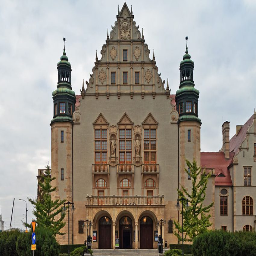

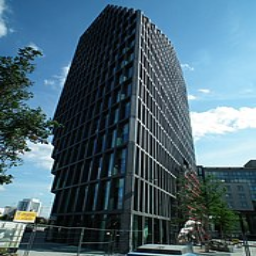

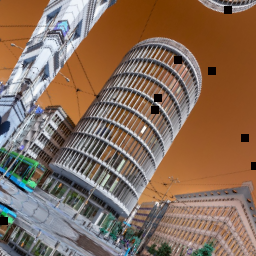

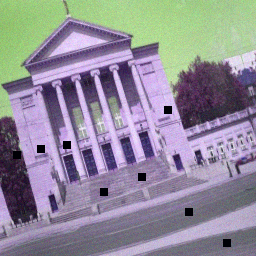

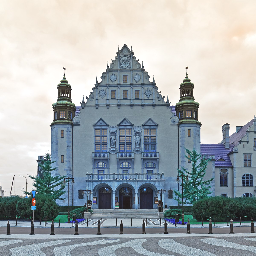

...

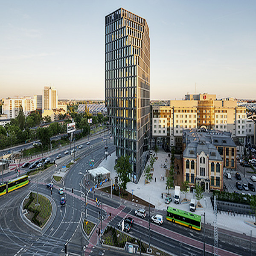

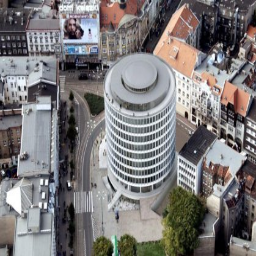

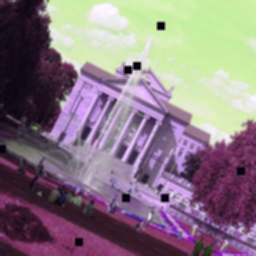

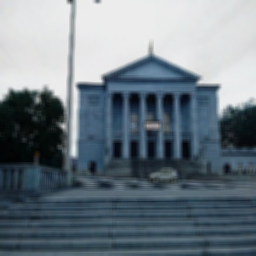

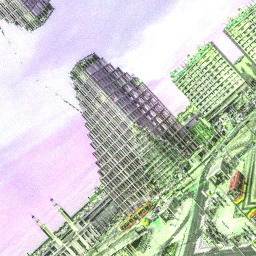

In [0]:
# show one image per class
count = 20
for i, img in enumerate(X_train):
  gc.cv2_imshow(img)
  if i == count:
    break

## 2) Model selection


In [0]:
model1 = keras.Sequential([
    keras.layers.Conv2D(16,(3,3),strides=(1,1),padding='same',activation='relu',input_shape=(IMG_SIZE,IMG_SIZE,3)),
    keras.layers.Conv2D(16,(3,3),strides=(1,1),padding='same',activation='relu'),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPooling2D(pool_size=(2,2)),
    keras.layers.Conv2D(32,(3,3),strides=(1,1),padding='same',activation='relu'),
    keras.layers.Conv2D(32,(3,3),strides=(1,1),padding='same',activation='relu'),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPooling2D(pool_size=(2,2)),
    keras.layers.Conv2D(64,(3,3),strides=(1,1),padding='same',activation='relu'),
    keras.layers.Conv2D(64,(3,3),strides=(1,1),padding='same',activation='relu'),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPooling2D(pool_size=(2,2)),
    keras.layers.Flatten(),
    keras.layers.Dense(512, activation='relu'),
    keras.layers.Dropout(0.25),
    keras.layers.Dense(5, activation='softmax')
])


optimizer = Adam(learning_rate=0.001)
loss_function = keras.losses.SparseCategoricalCrossentropy(from_logits=False)

model1.compile(optimizer=optimizer,loss=loss_function, metrics=['accuracy'])
model1.summary()


Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_34 (Conv2D)           (None, 256, 256, 16)      448       
_________________________________________________________________
conv2d_35 (Conv2D)           (None, 256, 256, 16)      2320      
_________________________________________________________________
batch_normalization_25 (Batc (None, 256, 256, 16)      64        
_________________________________________________________________
max_pooling2d_9 (MaxPooling2 (None, 128, 128, 16)      0         
_________________________________________________________________
conv2d_36 (Conv2D)           (None, 128, 128, 32)      4640      
_________________________________________________________________
conv2d_37 (Conv2D)           (None, 128, 128, 32)      9248      
_________________________________________________________________
batch_normalization_26 (Batc (None, 128, 128, 32)     

Crete resnet block


In [0]:
def create_resblock(input_layer: keras.layers.Layer, nb_filters: int, conv_kernel_size: int) -> keras.layers.Layer:

  x = keras.layers.Conv2D(nb_filters,kernel_size=conv_kernel_size,padding='same')(input_layer)
  x = keras.layers.BatchNormalization()(x)
  x = keras.layers.ReLU()(x)
  x = keras.layers.Conv2D(nb_filters,kernel_size=conv_kernel_size,padding='same')(x)
  x = keras.layers.BatchNormalization()(x)
  x = keras.layers.Add()([x,input_layer])
  x = keras.layers.ReLU()(x)
  return x

In [0]:
inp = keras.layers.Input((IMG_SIZE,IMG_SIZE,3))
x = keras.layers.Conv2D(32,kernel_size=3, strides=1, padding='same', activation='relu')(inp)
x = create_resblock(x,32,3)
x = keras.layers.Conv2D(64,kernel_size=3, strides=1, padding='same', activation='relu')(inp)
x = create_resblock(x,64,3)
x = keras.layers.Conv2D(128,kernel_size=3, strides=1, padding='same', activation='relu')(inp)
x = create_resblock(x,128,3)
x = keras.layers.GlobalAveragePooling2D()(x)
x = keras.layers.Dropout(0.05)(x)
x = keras.layers.Dense(5, activation='softmax')(x)

model2 = keras.Model(inputs=inp, outputs=x)
optimizer2 = Adam(0.0001)
model2.compile(optimizer=optimizer2,loss=loss_function, metrics=['accuracy'])
model2.summary()

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d_45 (Conv2D)              (None, 256, 256, 128 3584        input_4[0][0]                    
__________________________________________________________________________________________________
conv2d_46 (Conv2D)              (None, 256, 256, 128 147584      conv2d_45[0][0]                  
__________________________________________________________________________________________________
batch_normalization_29 (BatchNo (None, 256, 256, 128 512         conv2d_46[0][0]                  
____________________________________________________________________________________________

Test Pretrained architecture 

In [0]:
input_layer = keras.layers.Input((IMG_SIZE,IMG_SIZE,3))
model3 = keras.Sequential()
pretrain_part = keras.applications.xception.Xception(include_top=False, weights='imagenet',
                                                 input_tensor=input_layer, input_shape=(IMG_SIZE,IMG_SIZE,3),
                                                 classes=5)
#make only 6 last layeres trainable
for layer in pretrain_part.layers[:-6]:
  layer.trainable = False
#pretrain_part.summary()

model3.add(pretrain_part)
model3.add(keras.layers.Flatten())
model3.add(keras.layers.Dense(64))
model3.add(keras.layers.Dropout(0.1))
model3.add(keras.layers.Dense(5, activation='softmax'))

model3.summary()

model3.compile(optimizer=optimizer,loss=loss_function, metrics=['accuracy'])

#make only 3 last layeres trainable
for layer in model3.layers[:-3]:
  layer.trainable = False




Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
xception (Model)             (None, 8, 8, 2048)        20861480  
_________________________________________________________________
flatten_8 (Flatten)          (None, 131072)            0         
_________________________________________________________________
dense_16 (Dense)             (None, 64)                8388672   
_________________________________________________________________
dropout_8 (Dropout)          (None, 64)                0         
_________________________________________________________________
dense_17 (Dense)             (None, 5)                 325       
Total params: 29,250,477
Trainable params: 13,137,797
Non-trainable params: 16,112,680
_________________________________________________________________


## 3) Training

In [0]:
def show_history(history):
  fig, ax = plt.subplots(1,2,figsize=(10,10))
  ax[0].plot(history.history['accuracy'], label='accuracy_rate')
  ax[0].plot(history.history['val_accuracy'], label='val_accuracy_rate')
  ax[0].legend()

  ax[1].plot(history.history['loss'], label='loss_rate')
  ax[1].plot(history.history['val_loss'], label='val_loss_rate')
  ax[1].legend()


In [0]:
my_callback = keras.callbacks.EarlyStopping(monitor='val_loss',min_delta=0, 
                                            patience=20, mode = 'auto', restore_best_weights=True)
def scheduler(epoch, lr):
  if epoch % 10 == 0:
     lr = lr / 10.0
  return lr

sched_callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
#https://www.learnopencv.com/keras-tutorial-fine-tuning-using-pre-trained-models/
history = model1.fit(X_train,y_train,epochs=100,verbose=1,
       validation_data=(X_valid,y_valid), callbacks=[my_callback, sched_callback], batch_size=128)

Epoch 1/100
32/32 [==============================] - 26s 799ms/step - loss: 2.7402 - accuracy: 0.4237 - val_loss: 1.5140 - val_accuracy: 0.3377 - lr: 1.0000e-04
Epoch 2/100
32/32 [==============================] - 22s 673ms/step - loss: 0.7311 - accuracy: 0.7506 - val_loss: 1.4102 - val_accuracy: 0.4151 - lr: 1.0000e-04
Epoch 3/100
32/32 [==============================] - 22s 674ms/step - loss: 0.4242 - accuracy: 0.8625 - val_loss: 1.2462 - val_accuracy: 0.4975 - lr: 1.0000e-04
Epoch 4/100
32/32 [==============================] - 22s 675ms/step - loss: 0.2765 - accuracy: 0.9236 - val_loss: 1.1076 - val_accuracy: 0.5739 - lr: 1.0000e-04
Epoch 5/100
32/32 [==============================] - 22s 674ms/step - loss: 0.1873 - accuracy: 0.9552 - val_loss: 1.0451 - val_accuracy: 0.6181 - lr: 1.0000e-04
Epoch 6/100
32/32 [==============================] - 22s 674ms/step - loss: 0.1085 - accuracy: 0.9696 - val_loss: 0.9927 - val_accuracy: 0.6492 - lr: 1.0000e-04
Epoch 7/100
32/32 [===============

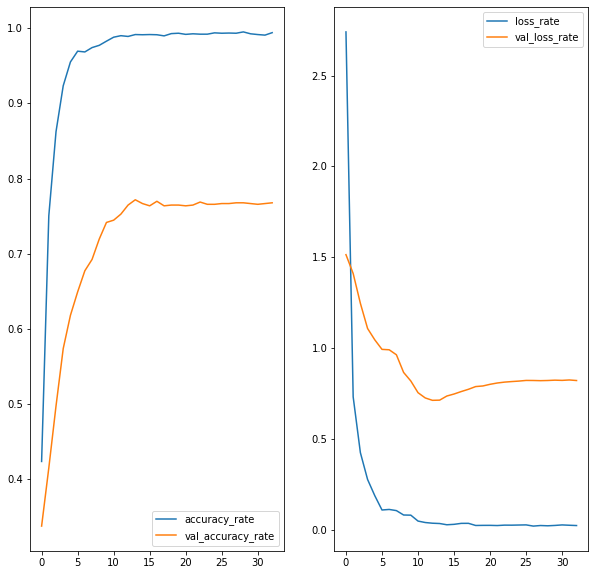

In [0]:
show_history(history)

In [0]:
history = model2.fit(X_train,y_train,epochs=100,verbose=1,
          validation_data=(X_valid,y_valid), callbacks=my_callback, batch_size=64)

Epoch 1/100
63/63 [==============================] - 58s 924ms/step - loss: 11.9675 - accuracy: 0.2228 - val_loss: 4.3924 - val_accuracy: 0.2352
Epoch 2/100
63/63 [==============================] - 57s 909ms/step - loss: 5.9790 - accuracy: 0.2482 - val_loss: 3.0206 - val_accuracy: 0.2955
Epoch 3/100
63/63 [==============================] - 57s 908ms/step - loss: 5.3837 - accuracy: 0.2597 - val_loss: 2.3082 - val_accuracy: 0.2955
Epoch 4/100
63/63 [==============================] - 57s 909ms/step - loss: 4.7692 - accuracy: 0.2683 - val_loss: 1.8834 - val_accuracy: 0.3085
Epoch 5/100
63/63 [==============================] - 57s 909ms/step - loss: 4.1083 - accuracy: 0.2778 - val_loss: 1.6826 - val_accuracy: 0.3487
Epoch 6/100
63/63 [==============================] - 57s 908ms/step - loss: 3.5239 - accuracy: 0.3045 - val_loss: 1.9706 - val_accuracy: 0.3367
Epoch 7/100
63/63 [==============================] - 57s 909ms/step - loss: 2.9532 - accuracy: 0.3128 - val_loss: 2.4392 - val_accuracy

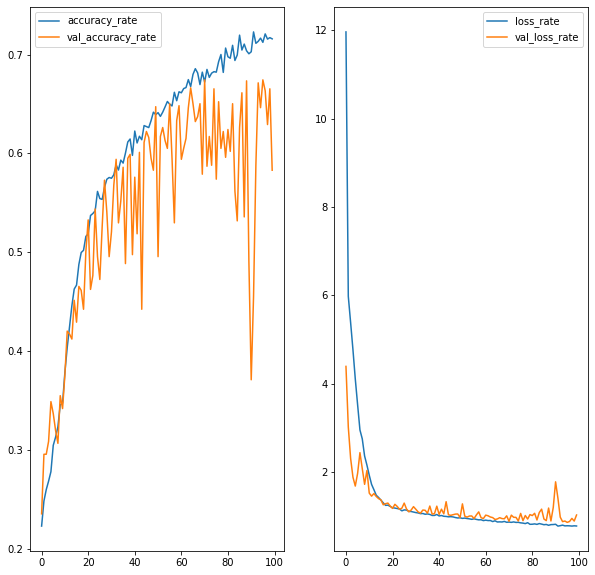

In [0]:
show_history(history)

In [0]:
history = model3.fit(X_train,y_train,epochs=100,verbose=1,
          validation_data=(X_valid,y_valid), callbacks=[my_callback, sched_callback], batch_size=128)

Epoch 1/100
32/32 [==============================] - 60s 2s/step - loss: 1.2887 - accuracy: 0.5202 - val_loss: 2.6001 - val_accuracy: 0.5055 - lr: 1.0000e-04
Epoch 2/100
32/32 [==============================] - 59s 2s/step - loss: 0.7483 - accuracy: 0.7272 - val_loss: 2.2617 - val_accuracy: 0.5447 - lr: 1.0000e-04
Epoch 3/100
32/32 [==============================] - 59s 2s/step - loss: 0.4582 - accuracy: 0.8582 - val_loss: 1.1869 - val_accuracy: 0.6754 - lr: 1.0000e-04
Epoch 4/100
32/32 [==============================] - 59s 2s/step - loss: 0.3051 - accuracy: 0.9045 - val_loss: 1.0168 - val_accuracy: 0.7176 - lr: 1.0000e-04
Epoch 5/100
32/32 [==============================] - 59s 2s/step - loss: 0.2682 - accuracy: 0.9117 - val_loss: 0.7013 - val_accuracy: 0.7920 - lr: 1.0000e-04
Epoch 6/100
32/32 [==============================] - 59s 2s/step - loss: 0.1888 - accuracy: 0.9417 - val_loss: 0.5788 - val_accuracy: 0.8281 - lr: 1.0000e-04
Epoch 7/100
32/32 [==============================] -

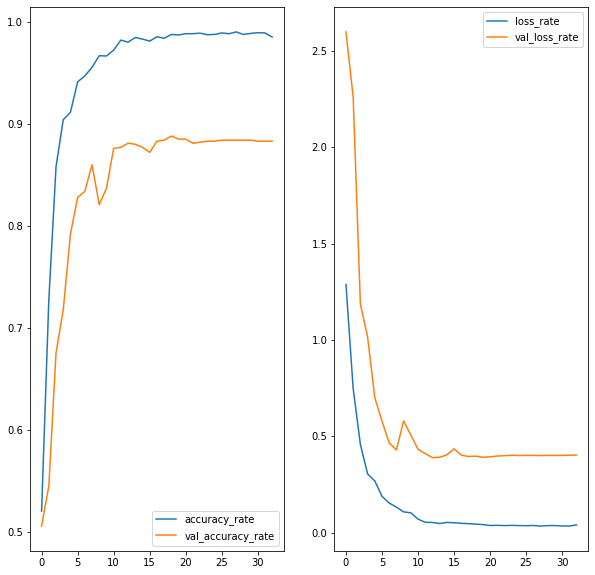

In [0]:
show_history(history)

In [0]:
path_to_model = '/content/drive/My Drive/BoW_project/net_model.p'
path_to_weights = '/content/drive/My Drive/BoW_project/net_weig.h5'

# serialize model to JSON
model_json = model3.to_json()
with open(path_to_model, "w") as json_file:
    json_file.write(model_json)
# serialize weights to HDF5
model3.save_weights(path_to_weights)
print("Saved model to disk")

Saved model to disk


## 4) Test results

In [0]:
def show_probabilty(img, label, model, y_labels):
  test = np.expand_dims(img,axis=0)
  pred = model.predict(test)[0]

  #print original image
  fig, ax = plt.subplots(1,2,figsize=(15,5))
  ax[0].imshow(img)
  ax[0].set_title(y_labels[label])

  # decide if prediciion is good
  color = np.full(5, 'b')
  predicted_class = np.argmax(pred)
  if predicted_class == label:
    color[predicted_class] = 'g'
  else:
    color[predicted_class] = 'r'
  
  # show probablity histogram
  ax[1].bar(y_labels, pred, color = color)
  plt.title("Probability per classs")
  plt.show()

In [0]:


print(model3.evaluate(X_valid,y_valid))

print(model3.evaluate(X_test,y_test))


32/32 [==============================] - 12s 371ms/step - loss: 0.3895 - accuracy: 0.8814
[0.3895256817340851, 0.8814070224761963]
1/1 [==============================] - 0s 1ms/step - loss: 0.9489 - accuracy: 0.7600
[0.9488939046859741, 0.7599999904632568]


In [0]:
for index, img in enumerate(X_test):
  show_probabilty(img, y_test[index] , model2, list(y_labels.values()))

## 5) Sum up

The best obtained result on test dataset, which was relative hard comparing to train/validate, is 76 accuracy. It's warse than Bag of words method score but we could probably obtaing better results when there would be much more photos, which CNNs requieres. 

Load saved dataset and classifiers. Show results

Loaded model from disk
Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
xception (Model)             (None, 8, 8, 2048)        20861480  
_________________________________________________________________
flatten_8 (Flatten)          (None, 131072)            0         
_________________________________________________________________
dense_16 (Dense)             (None, 64)                8388672   
_________________________________________________________________
dropout_8 (Dropout)          (None, 64)                0         
_________________________________________________________________
dense_17 (Dense)             (None, 5)                 325       
Total params: 29,250,477
Trainable params: 8,388,997
Non-trainable params: 20,861,480
_________________________________________________________________


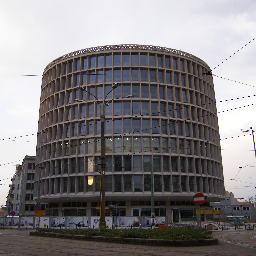

okraglak


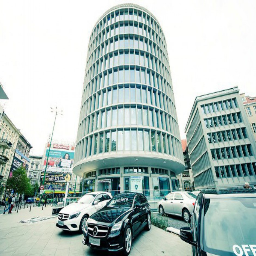

okraglak


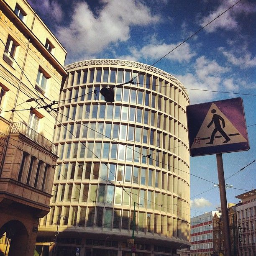

okraglak


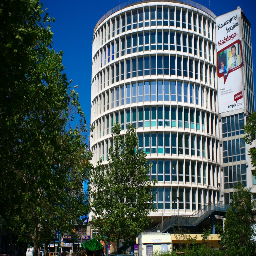

okraglak


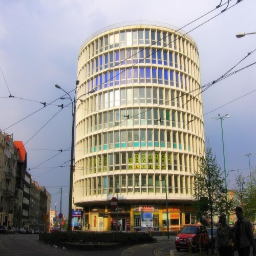

okraglak


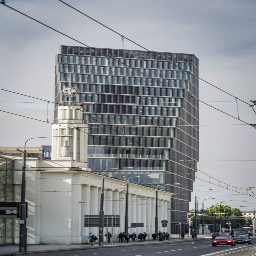

okraglak


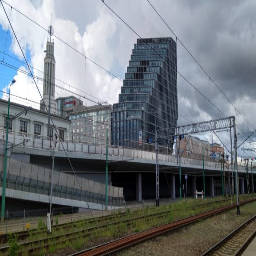

katedra


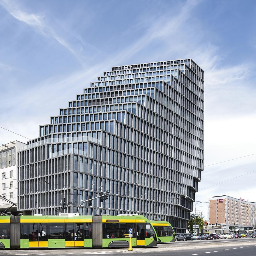

baltyk


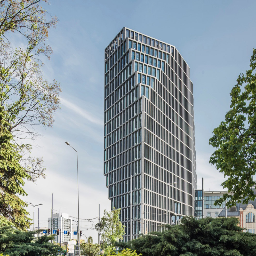

baltyk


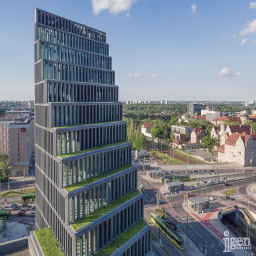

baltyk


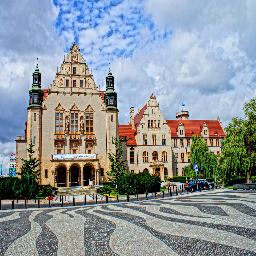

uam


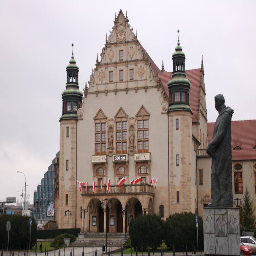

uam


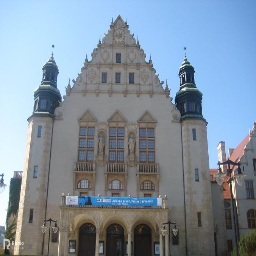

uam


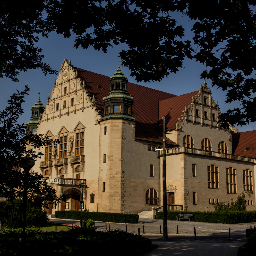

katedra


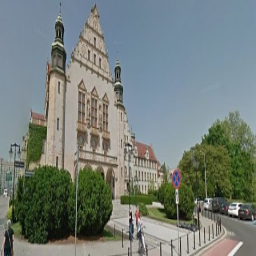

uam


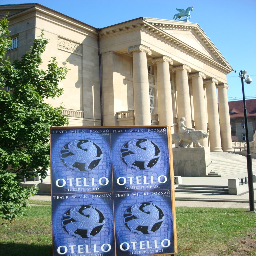

teatr_wielki


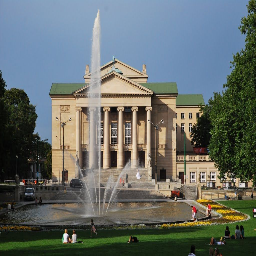

teatr_wielki


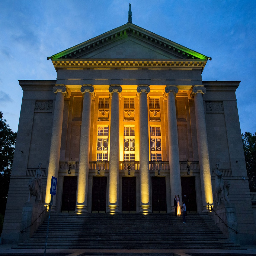

uam


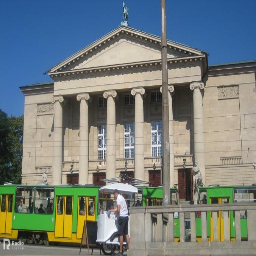

teatr_wielki


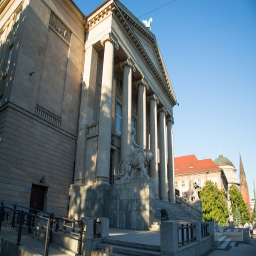

teatr_wielki


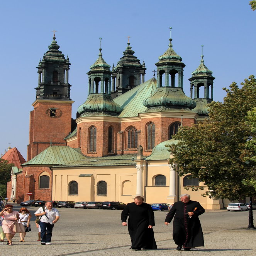

katedra


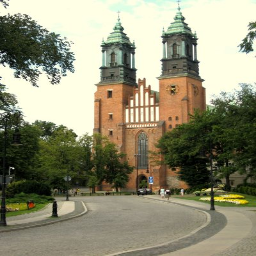

katedra


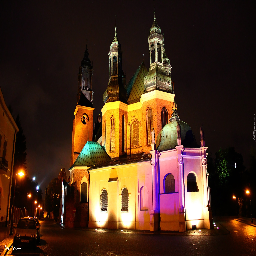

teatr_wielki


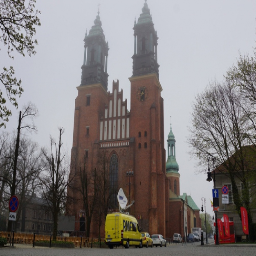

katedra


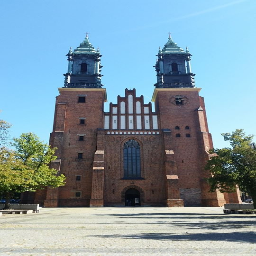

baltyk


In [11]:
# path to saved calssifiers
path_to_model = '/content/drive/My Drive/BoW_project/net_model.p'
path_to_weights = '/content/drive/My Drive/BoW_project/net_weig.h5'
optimizer = Adam()
# load json and create model
json_file = open(path_to_model, 'r')
loaded_model_json = json_file.read()
json_file.close()
loaded_model = keras.models.model_from_json(loaded_model_json)
# load weights into new model
loaded_model.load_weights(path_to_weights)
print("Loaded model from disk")
loaded_model.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])

loaded_model.summary()

for i,img in enumerate(X_test):
  y_predict = loaded_model.predict(np.expand_dims(img, axis=0),y_test[0])
  #print(img.shape)
  gc.cv2_imshow(img)
  print(y_labels[np.argmax(y_predict)])

# GradCam test

In [0]:
from typing import Optional
import cv2
import numpy as np


class GradCAM:

  def __init__(self, model: tf.keras.models.Model, layer_name: Optional[str]=None):
    self.model = model
    self.layer_name = layer_name if layer_name is not None else self.find_target_layer()

  def find_target_layer(self) -> str:
    # Attempting to find final network convolutional layer – we check layer by layer, 
    # going from the network end, until we find 4D output layer (pooling output and layers
    # in "classification part" are 2D on the other hand).
    for layer in reversed(self.model.layers):
      if len(layer.output_shape) == 4:
        print(layer.name)
        return layer.name
    else:
      raise ValueError('4D layer not found in the model. GradCAM cannot be applied.')

  def compute_heatmap(self, image: np.array, class_idx: int, eps: float = 1e-8) -> np.array:
    # Modified model, that will output not only the final predictions, but final convolutions output directly.
    # print(find_layer_by_name(model, self.layer_name).output)
    gradient_model = tf.keras.models.Model(inputs=[self.model.inputs], 
                                           outputs=[
                                                    self.model.get_layer(self.layer_name).output,
                                                    
                                                    # find_layer_by_name(model, self.layer_name).output,
                                                    self.model.output
                                                    ])
    
    # Turn on gradient recording with corresponding context manager.
    with tf.GradientTape() as tape:
      # Pass the image through network and grab loss for specified class id.
      inputs = tf.cast(np.expand_dims(image, axis=0), dtype=tf.float32)
      conv_outputs, preds = gradient_model(inputs)
      loss = preds[:, class_idx]
    
    # Compute gradients with autodiff framework.
    gradients = tape.gradient(loss, conv_outputs)

    # "Guiding" gradients – filtering out the pixels which weren't activated during
    # on the last convolution step and the ones that didn't affected prediction of
    # class of interest in "classification part".
    conv_out_nonzero_mask = tf.cast(conv_outputs > 0, dtype=tf.float32)
    gradients_nonzero_mask = tf.cast(gradients > 0, dtype=tf.float32)
    guided_gradients = gradients * conv_out_nonzero_mask * gradients_nonzero_mask

    # Removal of batch dimension.
    conv_outputs = conv_outputs[0]
    guided_gradients = guided_gradients[0]

    # Compute weights by averaging gradients across filters.
    weights = tf.reduce_mean(guided_gradients, axis=(0, 1))
    cam = tf.reduce_sum(weights * conv_outputs, axis=-1)

    # Final heatmap generation
    h, w = image.shape[:2]
    heatmap = cv2.resize(cam.numpy(), (w, h))

    # Min-max scaling of heatmap and later conversion to uint8 (for visualization)
    heatmap = (heatmap - heatmap.min() + eps) / (heatmap.max() - heatmap.min() + eps)  # Note: eps to avoid zero division.
    heatmap = (heatmap * 255).astype(np.uint8)

    return heatmap 


In [44]:
grad_cam = GradCAM(loaded_model.get_layer('xception'))

block14_sepconv2_act


okraglak


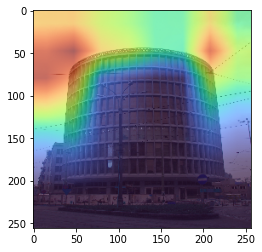

okraglak


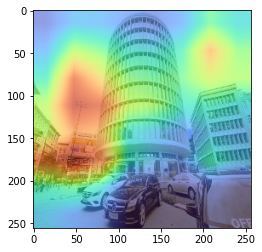

okraglak


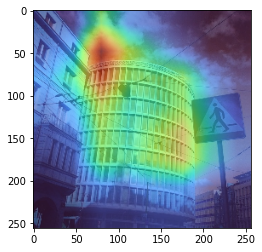

okraglak


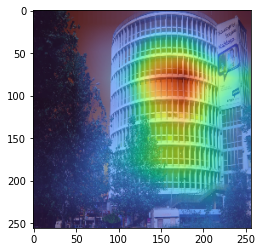

okraglak


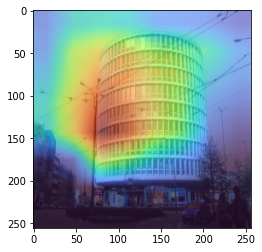

okraglak


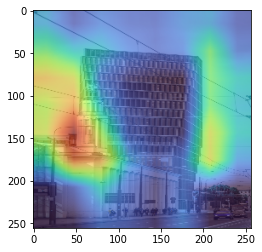

katedra


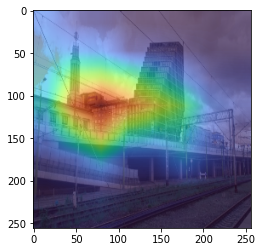

baltyk


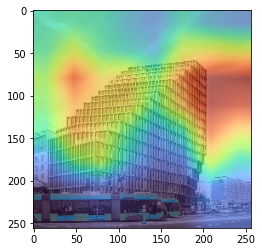

baltyk


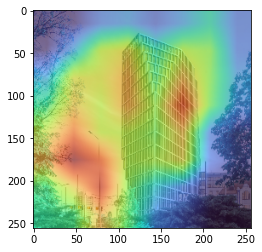

baltyk


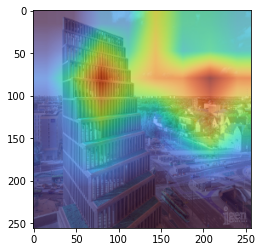

uam


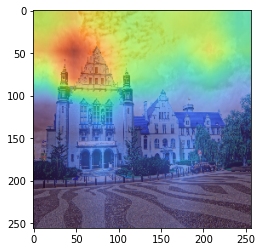

uam


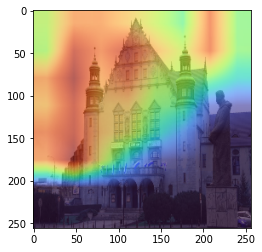

uam


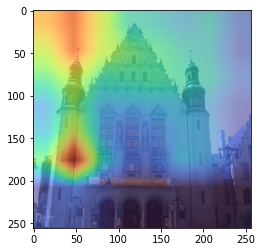

katedra


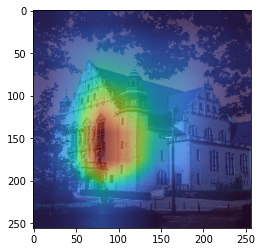

uam


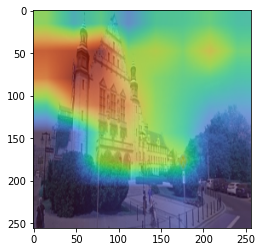

teatr_wielki


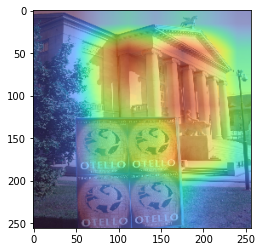

teatr_wielki


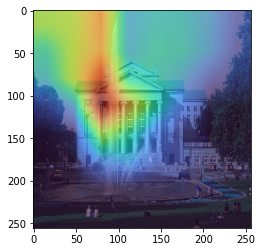

uam


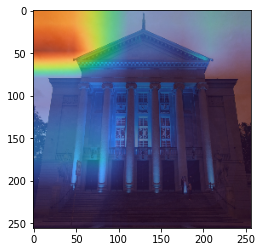

teatr_wielki


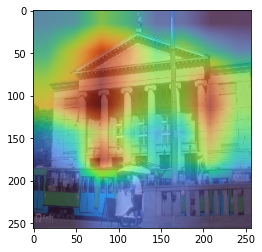

teatr_wielki


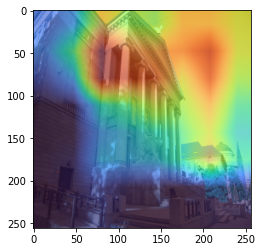

katedra


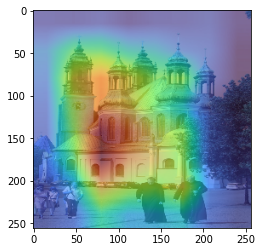

katedra


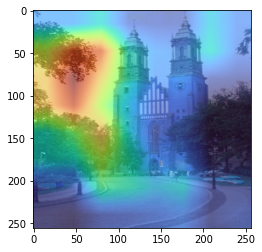

teatr_wielki


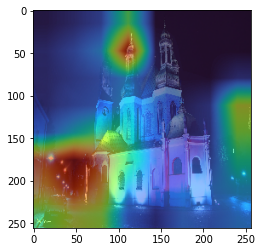

katedra


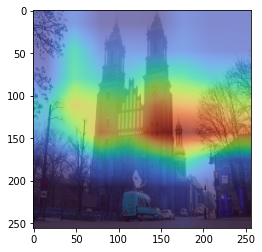

baltyk


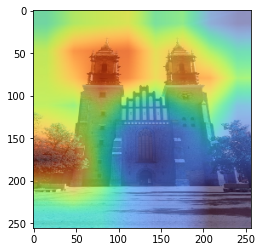

In [46]:
for i,img in enumerate(X_test):
  y_predict = loaded_model.predict(np.expand_dims(img, axis=0),y_test[0])
  print(y_labels[np.argmax(y_predict)])
  predicted_class = np.argmax(y_predict)
  heatmap = grad_cam.compute_heatmap(img, predicted_class)
  colormap = cv2.COLORMAP_TURBO
  heatmap = cv2.applyColorMap(heatmap, colormap)[:, :, ::-1]  
  h, w = img.shape[:2]
  heatmap = cv2.resize(heatmap, (w, h))
  overlay = cv2.addWeighted(img, 0.4, heatmap, 0.6, 0)
  plt.imshow(overlay)
  plt.show()
  